<p style="font-family:Times New Roman; font-size:120%">
    -Aleksander Nistad Sekkelsten
</p>
<h1 style="font-family:Times New Roman; font-size: 300%"><center> Machine Learning For Physics; Project 1 </center></h1>



---
<h2 style="font-family:Times New Roman; font-size:200%">Part I | Initializing Notebook |</h2>

In [1]:
import Pkg; Pkg.activate(".julia/environments/v1.10/Project.toml")
Pkg.add(["SCS", "Convex","PlotThemes","Images"])
using Plots, Random, NBInclude, LinearAlgebra, Statistics, Distributions, Convex, SCS, Images
using Plots.PlotMeasures
using StatsBase: sample
theme(:dao)

  Activating project at `~/.julia/environments/v1.10`
    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`


In [2]:
@nbinclude("/Users/aleksandersekkelsten/Downloads/Project 1 function.ipynb")

CrossValidation

In [4]:
# List all methods/functions defined
println("  ----  Functions Defined for this notebook  ----")
for n in names(Main)
    if isa(getfield(Main, n), Function)
        println(" - ",n)
    end
end

  ----  Functions Defined for this notebook  ----
 - Bootstrap
 - CrossValidation
 - DataProjector
 - Franke
 - LassoReg
 - MSE
 - R2
 - Regression
 - SplitData2D


In [6]:
?CrossValidation

search: CrossValidation



```
CrossValidation(X, Y, Z, k_folds::Int64, degrees::Int64, Method; lambda=0)
```

Performs k-fold cross-validation to evaluate a regression model on the provided dataset. The function splits the data into `k_folds`, fits a model on the training data, and evaluates it on the test data for each fold, returning the mean error across all folds.

# Arguments

  * `X::Array{Float64}`: The x-coordinates of the input data (for grid).
  * `Y::Array{Float64}`: The y-coordinates of the input data (for grid).
  * `Z::Array{Float64}`: The z-values (target) of the dataset.
  * `k_folds::Int64`: The number of folds to use in cross-validation. The data is split into `k_folds` parts, where each part is used once as the test set.
  * `degrees::Int64`: The degree of the polynomial used to construct the design matrix.
  * `Method::Symbol`: The regression method to use. Can be:

      * `:OLS` for Ordinary Least Squares.
      * `:Ridge` for Ridge regression.
      * `:Lasso` for Lasso regression.
  * `lambda::Float64` (optional): The regularization parameter for Ridge or Lasso regression. Default is `0` (no regularization).

# Returns

  * `mean_error::Float64`: The mean error (MSE) across all the k-folds of cross-validation.

# Details

1. **Data Processing**: The input data `X`, `Y`, and `Z` are flattened and reshaped to prepare for the regression model. A design matrix is constructed using the `DataProjector` function, mapping the inputs into a higher-dimensional polynomial space defined by `degrees`.
2. **Shuffling and Splitting**: The data is shuffled randomly to remove any bias from its original ordering. The shuffled data is split into `k_folds` parts for cross-validation.
3. **Cross-Validation Loop**: For each fold:

      * The training set consists of all data except the current fold, and the test set consists of the current fold.
      * A regression model is fitted on the training data.
      * The model is evaluated on the test data, and the error (MSE) is calculated.
4. **Error Calculation**: The mean squared error (MSE) is computed for each fold, and the average error across all folds is returned as the overall performance metric.

# Example

```julia X = rand(10) Y = rand(10) Z = rand(10, 10) k_folds = 5 degrees = 3 Method = :Ridge

meanerror = CrossValidation(X, Y, Z, k_folds, degrees, Method, lambda=0.1)


---
<h2 style="font-family:Times New Roman; font-size:200%">Part II | Preparing Franke Function |</h2>

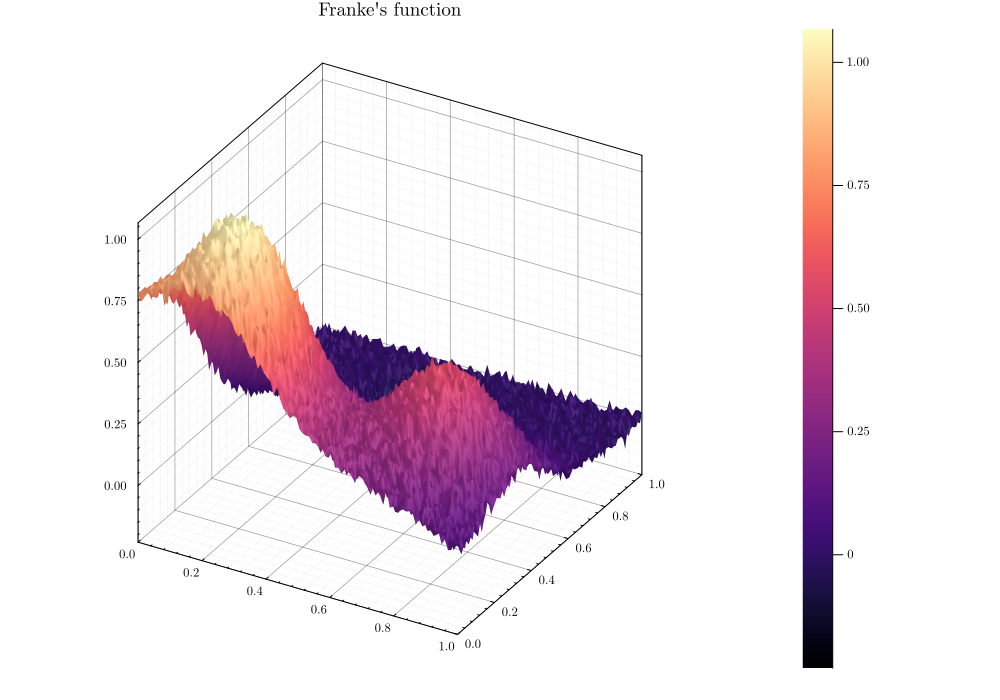

In [7]:
#X and Y range
X = range(0,1,100) |> collect 
Y = range(0,1,100) |> collect

Random.seed!(123)
ϵ=Normal(0, 0.02) # Noise
Z = Franke.(X',Y) .+ rand(ϵ,(100,100)) #Finding Z values

#Display Frankes funciton
surface(X,Y,Z, size=(1000,700),title="Franke's function")

---
<h2 style="font-family:Times New Roman; font-size:200%">Part III | Introducing OLS Regression |</h2>

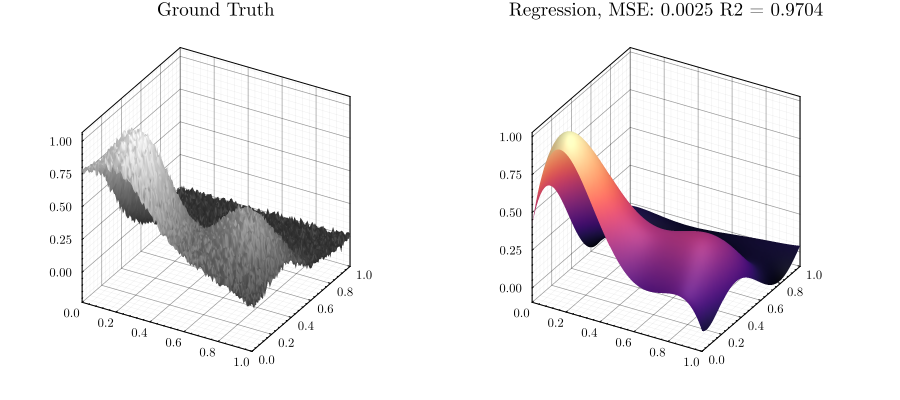

In [8]:

DM,Z_flat = DataProjector(X,Y, Z, 5,train=false)

xTrain, yTrain, zTrain, xTest, yTest, zTest = SplitData2D(X,Y,Z,0.8)
D_M_train = DataProjector(xTrain, yTrain, zTrain, 5)
D_M_test = DataProjector(xTest, yTest, zTest, 5)

betaVals = Regression(D_M_train,zTrain,"OLS")
est = DM*betaVals

r2 = round(R2(D_M_test, zTest,betaVals),digits=4)
mse = round(MSE(D_M_test,zTest,betaVals),digits=4)

surface(X,Y,Z, layout=(1,2), cbar=false, c=:grays,size=(900,400),title="Ground Truth")
surface!(subplot=2,X,Y,reshape(est, (100,100)), cbar=false, title="Regression, MSE: $(mse) R2 = $(r2)")

---
<h2 style="font-family:Times New Roman; font-size:200%">Part IV | Introducing Ridge and Lasso Regression |</h2>

In [9]:
lambdaVals = [1e-4,1e-1,1]

#Solve β for OLS and find estimate
betaValsOLS = Regression(D_M_train,zTrain,"OLS")
estOLS = DM*betaValsOLS

#R2 and MSE value for OLS
r2OLS = round(R2(D_M_test, zTest,betaValsOLS),digits=4)
mseOLS = round(MSE(D_M_test,zTest,betaValsOLS),digits=4)

println("OLS   |  MSE  = ",  mseOLS, "  R2 value = ", r2OLS, "\n")

surf = surface(X,Y,Z, layout=(4,2), cbar=false, c=:grays,size=(500,1000),title="Ground Truth")
surface!(surf,subplot=2,X,Y,reshape(estOLS, (100,100)), cbar=false, title="OLS Regression ")

for (i,lambda) in enumerate(lambdaVals) #Looping over various λ values: lambdaVals = [1e-4,1e-2,1e-1]
    #Solve β for Lasso and Ridge
    betaLasso = Regression(D_M_train, zTrain, "Lasso", λ=lambda)
    betaRidge = Regression(D_M_train, zTrain, "Ridge", λ=lambda)
    
    #Calculate MSE
    MSELasso = round(MSE(D_M_test, zTest, betaLasso, λ=0, γ=lambda),digits=4)
    MSERidge = round(MSE(D_M_test, zTest, betaRidge, λ=lambda, γ=0),digits=4)
    
    #Calculate R2 value
    r2Lasso = round(R2(D_M_test, zTest, betaLasso),digits=4)
    r2Ridge = round(R2(D_M_test, zTest, betaRidge),digits=4)
    
    println("Lasso |  λ = ", lambda,"  MSE:  ", MSELasso, "  R2 value = ", r2Lasso)
    println("Ridge |  λ = ", lambda,"  MSE:  ", MSERidge, "  R2 value = ", r2Ridge, "\n")
    
    #Find estimated answer
    estLasso = DM*betaLasso
    estRidge = DM*betaRidge
    
    #Display result
    surface!(surf,subplot=2*(i+1),X,Y,reshape(estLasso, (100,100)), cbar=false, title="Lasso Regression | λ= $(lambda)")
    surface!(surf,subplot=(2*(i+1)-1),X,Y,reshape(estRidge, (100,100)), cbar=false, title="Ridge Regression | λ= $(lambda)")
end

OLS   |  MSE  = 0.0025  R2 value = 0.9704

Lasso |  λ = 0.0001  MSE:  0.0414  R2 value = 0.9704
Ridge |  λ = 0.0001  MSE:  1.0328  R2 value = 0.9704

Lasso |  λ = 0.1  MSE:  10.7632  R2 value = 0.9559
Ridge |  λ = 0.1  MSE:  11.133  R2 value = 0.9291

Lasso |  λ = 1.0  MSE:  22.8137  R2 value = 0.9122
Ridge |  λ = 1.0  MSE:  12.4153  R2 value = 0.8902



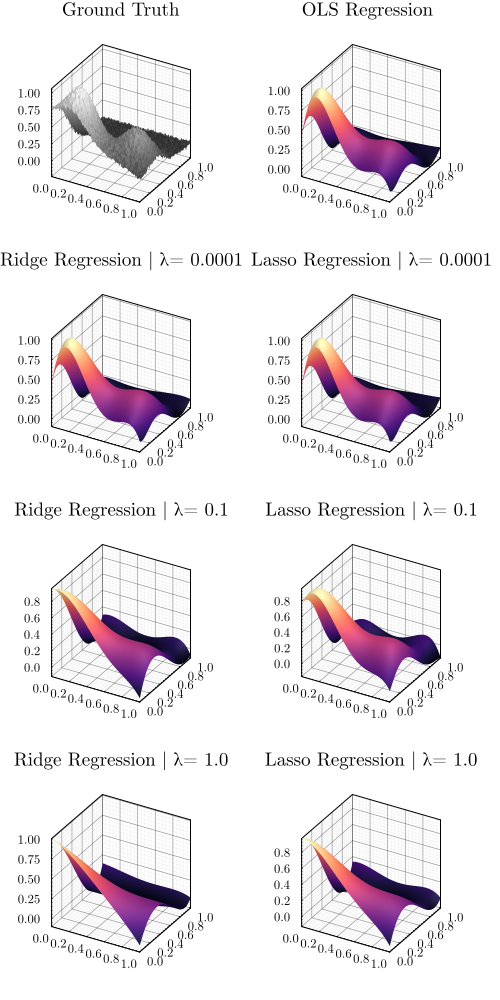

In [10]:
display(surf)

---
<h2 style="font-family:Times New Roman; font-size:200%">Part V | Performance Comparison |</h2>
<p style="font-family:Times New Roman; font-size:120%">
    This section is rather large, we first compare Test/Train Errors, then introduce Bootstrap resampling and analyze Error, Bias and Variance. Then we look at Cross-Validation. (Task e-f)
</p>

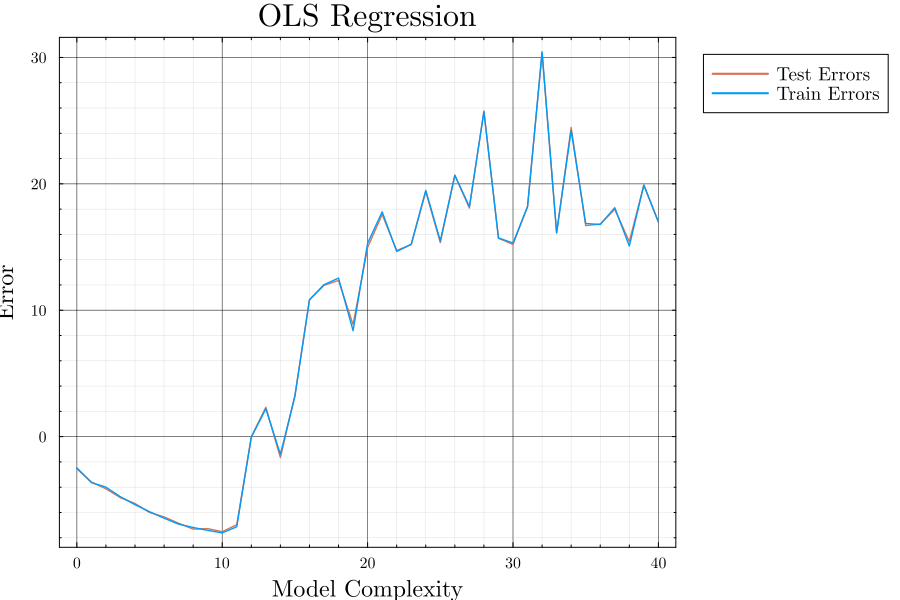

In [82]:
n=50
X2 = range(0,1,n) |> collect 
Y2 = range(0,1,n) |> collect
Z2 = Franke.(X2',Y2) .+ rand(ϵ,(n,n)) #Finding Z values


degrees = range(0,40) |> collect #Range of polynomial degrees

Test_Errors = zeros(length(degrees))
Train_Errors = zeros(length(degrees))
        
for (i,degree) in enumerate(degrees)
    #  ----  Initializing Data  ----
    xTrain, yTrain, zTrain, xTest, yTest, zTest = SplitData2D(X2,Y2,Z2,0.8)

    D_M_train = DataProjector(xTrain, yTrain, zTrain, degree)
    D_M_test = DataProjector(xTest, yTest, zTest, degree)

    #  ----  Solving OLS  ----
    betaValsOLS = Regression(D_M_train,zTrain,"OLS")
    
    #  ---- Updating Errors  ----
    Test_Errors[i] = MSE(D_M_test,zTest,betaValsOLS)
    
    Train_Errors[i] = MSE(D_M_train,zTrain,betaValsOLS)
end

plot(degrees, log.(Test_Errors), label="Test Errors", xlabel="Model Complexity", ylabel="Error", title = "OLS Regression",size=(900,600),titlefontsize=20,labelfontsize=15,legendfontsize=12,tickfontsize=10)
plot!(degrees, log.(Train_Errors), label="Train Errors")

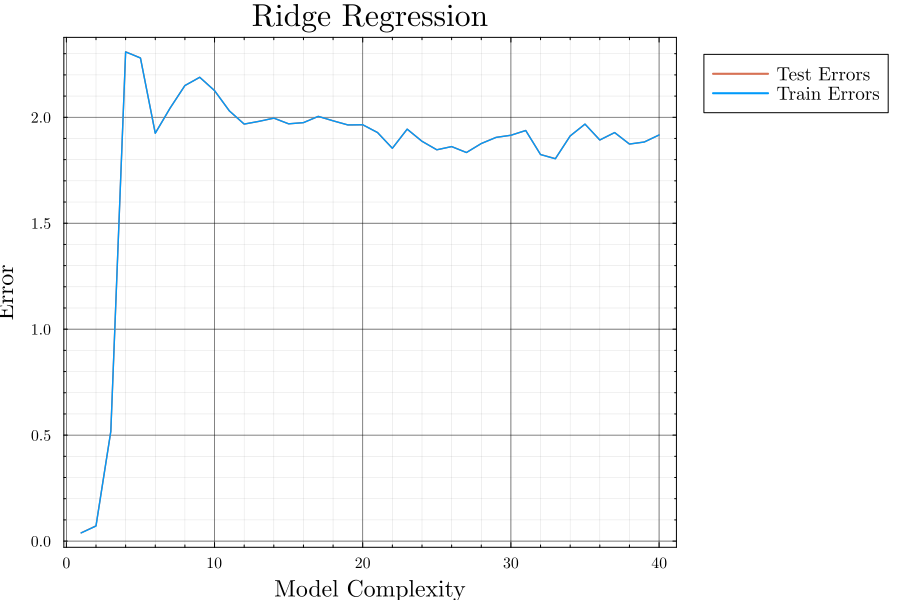

In [83]:
lambda = 1e-2 #λ for Ridge Regression
degrees = range(1,40) |> collect #Range of polynomial degrees

Test_Errors = zeros(length(degrees))
Train_Errors = zeros(length(degrees))
Bias = zeros(length(degrees))
Variance = zeros(length(degrees))
                
for (i,degree) in enumerate(degrees)
    
    #  ----  Initializing Data  ----
    xTrain, yTrain, zTrain, xTest, yTest, zTest = SplitData2D(X2,Y2,Z2,0.8)
    
    D_M_train = DataProjector(xTrain, yTrain, zTrain, degree)
    D_M_test = DataProjector(xTest, yTest, zTest, degree)

    #  ----  Solving Ridge  ----
    betaVals = Regression(D_M_train,zTrain,"Ridge", λ=lambda)

    #  ---- Updating Errors  ----
    Test_Errors[i] = MSE(D_M_test,zTest,betaVals, λ = lambda,γ=0)
    Train_Errors[i] = MSE(D_M_train,zTrain,betaVals, λ = lambda, γ=0)
end

plot(degrees, Test_Errors, label="Test Errors", xlabel="Model Complexity", ylabel="Error", title="Ridge Regression",size=(900,600),titlefontsize=20,labelfontsize=15,legendfontsize=12,tickfontsize=10)
plot!(degrees, Train_Errors, label="Train Errors")

<h2 style="font-family:Times New Roman; font-size:200%">Bootstrap Resampling</h2>

In [14]:
function BiasVarianceTradeOff(maxdeg, x, y, z, Method; numBootstraps=100, λ=0)
    xTrainb, yTrainb, zTrainb, xTestb, yTestb, zTestb = SplitData2D(x,y,z,0.8)

    degs = range(1,maxdeg) |> collect
    errors = zeros(length(degs))
    biases = zeros(length(degs))
    variances = zeros(length(degs))

    for (i,deg) in enumerate(degs)

        #  ----  Initializing Data  ----
        D_M_train = DataProjector(xTrainb, yTrainb, zTrainb, deg)
        D_M_test = DataProjector(xTestb, yTestb, zTestb, deg)

        #  ----  Apply Bootstrap  ----
        bootstrapBetas = Bootstrap(xTrainb, yTrainb, zTrainb, deg, numBootstraps,Method, λ=λ)

        #  ----  Analyzing Results  ----
        est_test = zeros(length(zTestb),numBootstraps)
        for i in 1:numBootstraps
            est_test[:,i] = D_M_test*bootstrapBetas[:,i]
        end

        #  ----  Update: Error, Bias and Variance  ----
        error_temp = zeros(length(zTestb))

        for i in 1:length(zTestb)
            error_temp[i] = mean( (zTestb[i] .- est_test[i,:]).^2 )

        end
        #display(error_temp)
        errors[i] = mean( error_temp )
        biases[i] = mean( (zTestb .- mean(est_test, dims=2)).^2 )
        variances[i] = mean( var(est_test, dims=2) )
    end
    return degs, errors, biases, variances
end

BiasVarianceTradeOff (generic function with 1 method)

In [15]:
#X and Y range
n=220
X_b = range(0,1,n) |> collect 
Y_b = range(0,1,n) |> collect
Z_b = Franke.(X_b',Y_b) .+ rand(ϵ,(n,n)) #Finding Z values

degs, errors, biases, variances = BiasVarianceTradeOff(14, X_b, Y_b, Z_b, "OLS", numBootstraps=100)
_, Ridge_errors, Ridge_biases, Ridge_variances = BiasVarianceTradeOff(14, X_b, Y_b, Z_b, "Ridge", numBootstraps=100, λ=1e-2)
#_, Lasso_errors, Lasso_biases, Lasso_variances = BiasVarianceTradeOff(14, X_b, Y_b, Z_b, "Lasso", λ=1e-2)

([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14], [0.026295194752727524, 0.01767714924035632, 0.008250637412577588, 0.004492032437974031, 0.0030965397015814754, 0.002583742032317128, 0.0023029226924490107, 0.0020885331397052054, 0.0019528103238614222, 0.0018763008900946204, 0.0018172461929201742, 0.0017588915993901316, 0.0016998678474324615, 0.0016444041222599146], [0.026293034572254438, 0.0176745974883059, 0.00824843387595873, 0.004490060820984682, 0.0030952595986474644, 0.002582596543697166, 0.002301734605619651, 0.002087343468165036, 0.0019516669723829109, 0.0018751271769276222, 0.0018160904641359335, 0.0017577672138626107, 0.0016987501830844356, 0.0016432839480615186], [2.182000477863207e-6, 2.577527323657591e-6, 2.225794564504795e-6, 1.991532312472801e-6, 1.2930332666774924e-6, 1.1570592120830272e-6, 1.2000877064236406e-6, 1.2016884244136445e-6, 1.1549004833442426e-6, 1.1855688555540905e-6, 1.1674028123640493e-6, 1.1357429570919012e-6, 1.1289538868949002e-6, 1.1314890892888817e-6]

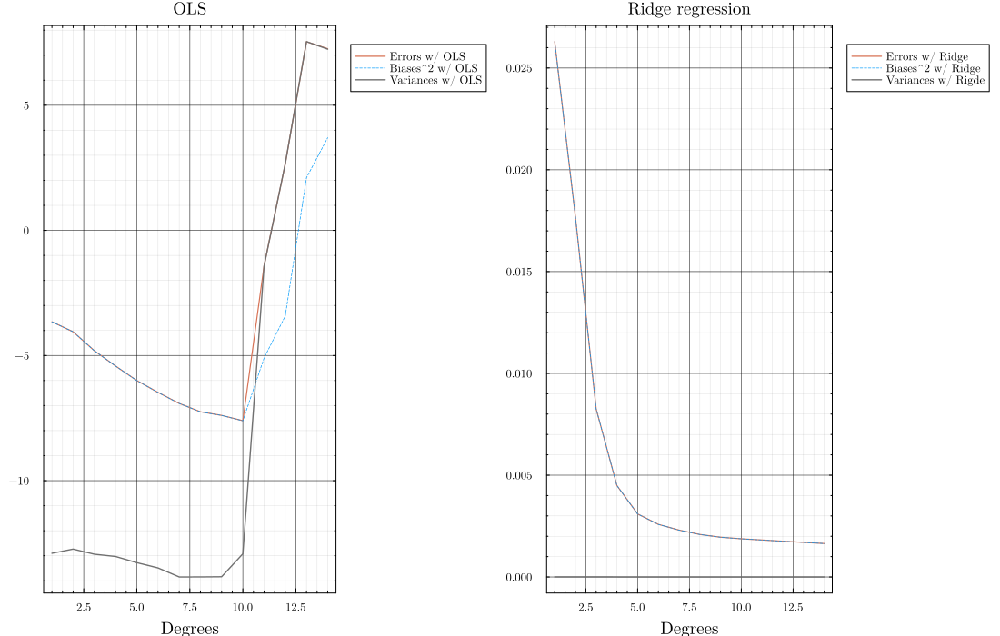

In [27]:

plot(layout=(1,2), degs, log.(errors), label="Errors w/ OLS",size=(1100,600),title="OLS", linewidth=1.2)
plot!(subplot=1, degs, log.(biases), xlabel="Degrees", label="Biases^2 w/ OLS",ls=:dash, linewidth=0.7)
plot!(subplot=1, degs, log.(variances), label="Variances w/ OLS")

plot!(subplot=2, degs, (Ridge_errors), label="Errors w/ Ridge", title="Ridge regression", linewidth=1.2)
plot!(subplot=2, degs, (Ridge_biases), xlabel="Degrees", label="Biases^2 w/ Ridge",ls=:dash, linewidth=0.7)
plot!(subplot=2, degs, (Ridge_variances), label="Variances w/ Rigde")
#savefig("BiasVariance_official")

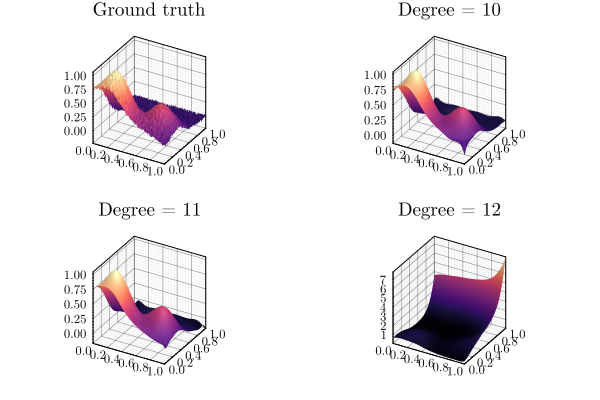

In [48]:
p = surface(X,Y,Z, layout=(2,2),title="Ground truth",cbar=false)
for i in 10:12 #Degrees 10,11 and 12
    #  ----  Initializing Data  ----
    DM,Z_flat = DataProjector(X,Y, Z, i,train=false)

    xTrain, yTrain, zTrain, xTest, yTest, zTest = SplitData2D(X,Y,Z,0.7)
    D_M_train = DataProjector(xTrain, yTrain, zTrain, i)
    D_M_test = DataProjector(xTest, yTest, zTest, i)

    #  ---- Solve for OLS  ----
    betaVals = Regression(D_M_train,zTrain,"OLS")
    estim = DM*betaVals
    
    #  ----  Display  ----
    surface!(p,subplot=(i-8),X,Y,reshape(estim, (100,100)),title="Degree = $(i)",cbar=false)
end
display(p)

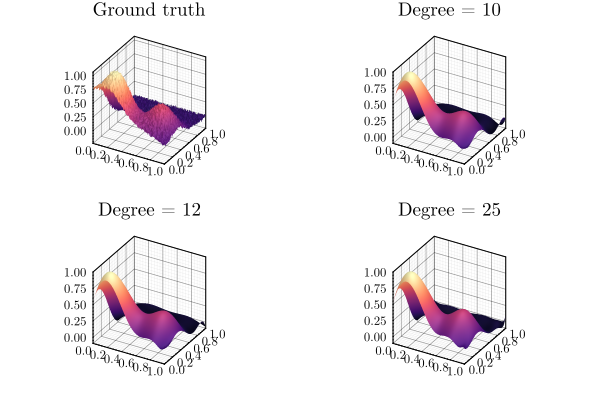

In [49]:
degrees = [10, 12, 25]
p = surface(X,Y,Z, layout=(2,2),title="Ground truth",cbar=false)

for (i,degree) in enumerate(degrees) #Degrees 10,11 and 12
    #  ----  Initializing Data  ----
    DM,Z_flat = DataProjector(X,Y, Z, degree,train=false)

    xTrain, yTrain, zTrain, xTest, yTest, zTest = SplitData2D(X,Y,Z,0.7)
    D_M_train = DataProjector(xTrain, yTrain, zTrain, degree)
    D_M_test = DataProjector(xTest, yTest, zTest, degree)

    #  ---- Solve for Ridge  ----
    betaVals = Regression(D_M_train,zTrain,"Ridge", λ=1e-3)
    estim = DM*betaVals
    
    #  ----  Display  ----
    surface!(p,subplot=(i+1),X,Y,reshape(estim, (100,100)),title="Degree = $(degree)",cbar=false)
end
display(p)

<h2 style="font-family:Times New Roman; font-size:200%">k-fold Cross-Validation</h2>

In [68]:
degree=13
CVOLS = CrossValidation(X, Y, Z, 10, degree,"OLS")

xTrain, yTrain, zTrain, xTest, yTest, zTest = SplitData2D(X,Y,Z,0.7)
D_M_train = DataProjector(xTrain, yTrain, zTrain, degree)
D_M_test = DataProjector(xTest, yTest, zTest, degree)

bootstrapBetas = Bootstrap(xTrain, yTrain, zTrain, degree, 1000,"OLS")
BOLS = MSE(D_M_test,zTest,vec(mean(bootstrapBetas,dims=2)), λ=0, γ=0)
CVRidge = CrossValidation(X, Y, Z, 10, degree, "Ridge", lambda=1e-3)
CVLasso = CrossValidation(X, Y, Z, 10, degree, "Lasso", lambda=1e-3)


println(" -----  CrossValidation Scores  ----- ", "\n")
println(" OLS   :  ", CVOLS, " B-Strap :  ", BOLS)
println(" Ridge :  ", round(CVRidge,digits=4))
println(" Lasso :  ", round(CVLasso,digits=4))

 -----  CrossValidation Scores  ----- 

 OLS   :  744.1632485046832 B-Strap :  0.21871154787851935
 Ridge :  2.5828
 Lasso :  1.6288


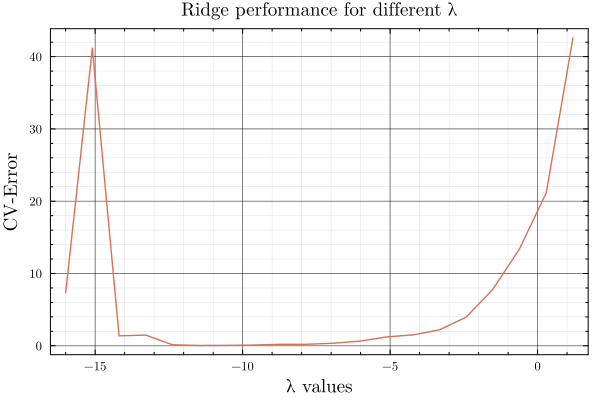

In [53]:
degree=12
lambdavals = 10 .^(range(-16,stop=1.2,length=20))
CVRidge = zeros(length(lambdavals))
for (i,Lambda) in enumerate(lambdavals)
    CVRidge[i] = CrossValidation(X, Y, Z, 10, degree, "Ridge", lambda=Lambda)
end
plot(log10.(lambdavals),(CVRidge), xlabel="λ values", ylabel="CV-Error", title="Ridge performance for different λ",legend=false)

In [54]:
function CrossValidation_Betas(X, Y, Z, k_folds::Int64, degrees::Int64, Method;lambda=0)
    #  ----  Data Processing  ----
    xData = repeat(X, inner=length(X))  # Repeat xData 
    yData = repeat(Y, outer=length(Y))  # Repeat yData 
    zData = vec(Z) #Flattened Z data
    DM = DataProjector(xData, yData, zData, degrees)
    
    N = length(zData)
    split = Int(N/k_folds)
    Errors = zeros(k_folds)
    
    #Shuffle
    shuffle = sample(1:N,N,replace=false)
    xData = xData[shuffle]
    yData = yData[shuffle]
    zData = zData[shuffle]
    betaVals = zeros((degrees + 1) * (degrees + 2) ÷ 2, k_folds)
    for i in 1:k_folds
        #  ----  Split Data  ----
        a = split*(i-1)+1
        b = split*(i)
        
        xTest = xData[a:b]
        yTest = yData[a:b]
        zTest = zData[a:b]
        
        xTrain = vcat(xData[1:a-1], xData[b+1:end])
        yTrain = vcat(yData[1:a-1], yData[b+1:end])
        zTrain = vcat(zData[1:a-1], zData[b+1:end])
        
        D_M_train = DataProjector(xTrain, yTrain, zTrain, degrees)
        D_M_test = DataProjector(xTest, yTest, zTest, degrees)
        
        #  ----  Apply Regression  ----
        betaVals[:,i] = Regression(D_M_train, zTrain, Method, λ=lambda)
    end
    return betaVals
end

CrossValidation_Betas (generic function with 1 method)

In [55]:
xTrainb, yTrainb, zTrainb, xTestb, yTestb, zTestb = SplitData2D(X,Y,Z,0.8)
folds=10
degs = range(0,15) |> collect
errors = zeros(length(degs))
biases = zeros(length(degs))
variances = zeros(length(degs))
CVRidge = zeros(length(degs))
for (i,deg) in enumerate(degs)
    D_M_test = DataProjector(xTestb, yTestb, zTestb, deg)
    #  ----  Apply Bootstrap  ----
    betaVals = CrossValidation_Betas(X, Y, Z, folds, deg, "OLS")

    #  ----  Analyzing Results  ----

    #  ----  Analyzing Results  ----
    est_test = zeros(length(zTestb),folds)
    for i in 1:folds
        est_test[:,i] = D_M_test*betaVals[:,i]
    end

    #  ----  Update: Error, Bias and Variance  ----
    error_temp = zeros(length(zTestb))

    for i in 1:length(zTestb)
        error_temp[i] = mean( (zTestb[i] .- est_test[i,:]).^2 )

    end
    #display(error_temp)
    errors[i] = mean( error_temp )
    biases[i] = mean( (zTestb .- mean(est_test, dims=2)).^2 )
    variances[i] = mean( var(est_test, dims=2) )
end

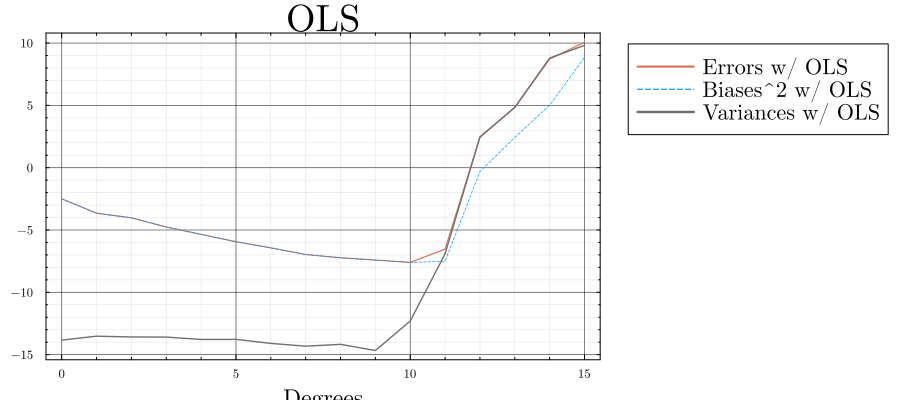

In [81]:
plot(degs, log.(errors), label="Errors w/ OLS",size=(900,400),title="OLS", linewidth=1.2, titlefontsize=24, legendfontsize=14,labelfontsize=15)
plot!(degs, log.(biases), xlabel="Degrees", label="Biases^2 w/ OLS",ls=:dash, linewidth=0.7)
plot!(degs, log.(variances), label="Variances w/ OLS")

In [62]:
xTrainb, yTrainb, zTrainb, xTestb, yTestb, zTestb = SplitData2D(X,Y,Z,0.8)

degs = range(0,15) |> collect
Ridge_errors = zeros(length(degs))
Ridge_biases = zeros(length(degs))
Ridge_variances = zeros(length(degs))
CVRidge = zeros(length(degs))
for (i,deg) in enumerate(degs)
    D_M_test = DataProjector(xTestb, yTestb, zTestb, deg)
    #  ----  Apply Bootstrap  ----
    betaVals = CrossValidation_Betas(X, Y, Z, folds, deg, "Ridge", lambda=1e-3)

    #  ----  Analyzing Results  ----
    est_test = zeros(length(zTestb),folds)
    for i in 1:folds
        est_test[:,i] = D_M_test*betaVals[:,i]
    end

    #  ----  Update: Error, Bias and Variance  ----
    error_temp = zeros(length(zTestb))

    for i in 1:length(zTestb)
        error_temp[i] = mean( (zTestb[i] .- est_test[i,:]).^2 )

    end
    #display(error_temp)
    Ridge_errors[i] = mean( error_temp )
    Ridge_biases[i] = mean( (zTestb .- mean(est_test, dims=2)).^2 )
    Ridge_variances[i] = mean( var(est_test, dims=2) )
end

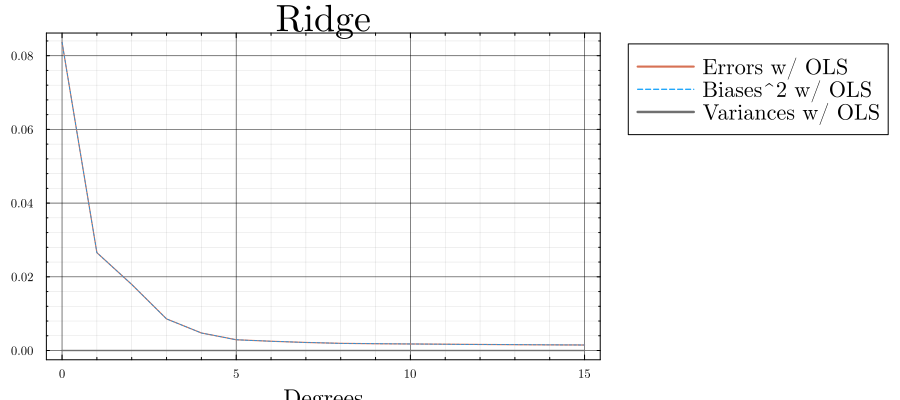

In [80]:
plot(degs, Ridge_errors, label="Errors w/ OLS",size=(900,400),title="Ridge", linewidth=1.2, titlefontsize=24, legendfontsize=14,labelfontsize=15)
plot!(degs, Ridge_biases, xlabel="Degrees", label="Biases^2 w/ OLS",ls=:dash, linewidth=0.7)
plot!(degs, Ridge_variances, label="Variances w/ OLS")

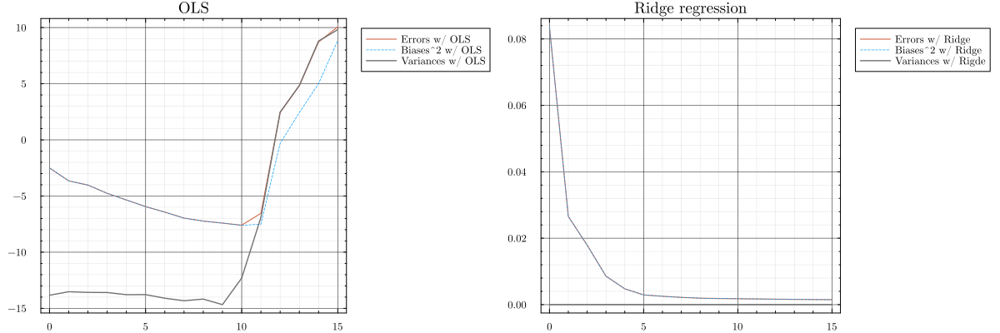

In [64]:

plot(layout=(1,2), degs, log.(errors), label="Errors w/ OLS",size=(1200,400),title="OLS", linewidth=1.2)
plot!(subplot=1, degs, log.(biases), label="Biases^2 w/ OLS",ls=:dash, linewidth=0.7)
plot!(subplot=1, degs, log.(variances), label="Variances w/ OLS")

plot!(subplot=2, degs, (Ridge_errors), label="Errors w/ Ridge", title="Ridge regression", linewidth=1.2)
plot!(subplot=2, degs, (Ridge_biases), label="Biases^2 w/ Ridge",ls=:dash, linewidth=0.7)
plot!(subplot=2, degs, (Ridge_variances), label="Variances w/ Rigde")

In [69]:
CVOLS = CrossValidation(X, Y, Z, 10, 5,"OLS")

xTrain, yTrain, zTrain, xTest, yTest, zTest = SplitData2D(X,Y,Z,0.7)
D_M_train = DataProjector(xTrain, yTrain, zTrain, 5)
D_M_test = DataProjector(xTest, yTest, zTest, 5)
bootstrapBetas = Bootstrap(xTrain, yTrain, zTrain, 5, 1000,"OLS")
BOLS = MSE(D_M_test,zTest,vec(mean(bootstrapBetas,dims=2)), λ=0, γ=0)
CVRidge = CrossValidation(X, Y, Z, 10, 5, "Ridge", lambda=1e-4)
CVLasso = CrossValidation(X, Y, Z, 10, 5, "Lasso", lambda=1e-4)


println(" -----  CrossValidation Scores  ----- ", "\n")
println(" OLS   :  ", CVOLS, " B-Strap :  ", BOLS)
println(" Ridge :  ", round(CVRidge,digits=4))
println(" Lasso :  ", round(CVLasso,digits=4))

 -----  CrossValidation Scores  ----- 

 OLS   :  0.002512391948531684 B-Strap :  0.0024762849623487866
 Ridge :  1.0342
 Lasso :  0.0413


---
<h2 style="font-family:Times New Roman; font-size:200%">Part VI | Real Image Data |</h2>

In [70]:
#  ----  Load Image  ----
img = load("/Users/aleksandersekkelsten/Downloads/SRTM_data_Norway_2.tif")
img_array = convert(Array{Float64}, img) #3601 x 1801

#  ----  Defining X and Y range  ----
y_img = range(1,3601) |> collect 
x_img = range(1,1801) |> collect

1801-element Vector{Int64}:
    1
    2
    3
    4
    5
    6
    7
    8
    9
   10
   11
   12
   13
    ⋮
 1790
 1791
 1792
 1793
 1794
 1795
 1796
 1797
 1798
 1799
 1800
 1801

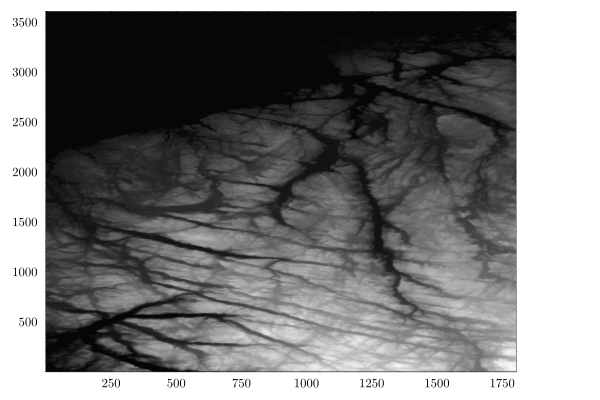

In [71]:
heat = heatmap(img_array, color = :greys, cbar=false)

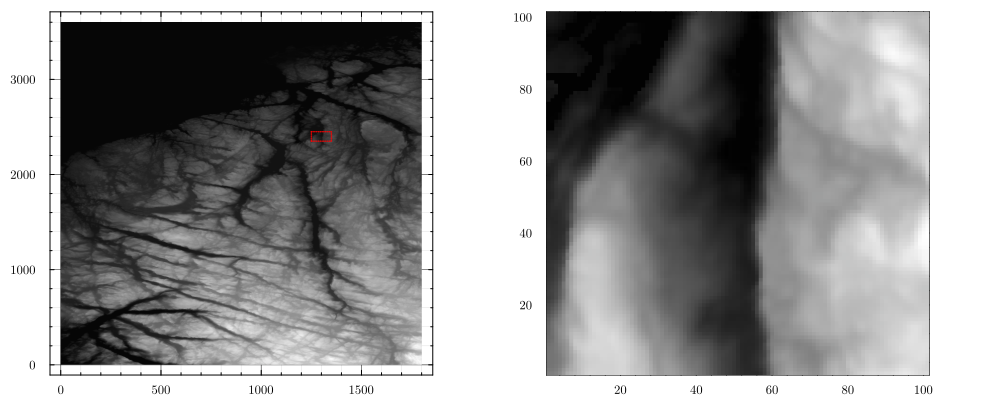

In [72]:
#  ----  Selecting an area of the Image  ----
(xmin,xmax) = (1250,1350)
(ymin,ymax) = (2350,2450)
img=img_array[ymin:ymax,xmin:xmax]
y_img = range(ymin,ymax) |> collect
x_img = range(xmin,xmax) |> collect

#  ----  Displaying The Selected Area  ----
heat = heatmap(layout = (1,2), img_array[1:end,1:end], color = :greys, cbar=false,size=(1000,400))
plot!(subplot=1,heat,[xmin,xmax], [ymin,ymin], ls=:dot,c=:red,alpha=0.8,label=false)
plot!(subplot=1,heat,[xmin,xmax], [ymax,ymax], ls=:dot,c=:red,alpha=0.8,label=false)
plot!(subplot=1,heat,[xmin,xmin], [ymin,ymax], ls=:dot,c=:red,alpha=0.8,label=false)
plot!(subplot=1,heat,[xmax,xmax], [ymin,ymax], ls=:dot,c=:red,alpha=0.8,label=false)
heatmap!(subplot=2,img_array[ymin:ymax,xmin:xmax], color = :greys, cbar=false)
display(heat)

In [79]:
#=
# ----  Initializing Data  ----
deg=110
lambda = 1e-2
degs = [10, 20, 50, 80, 110, 150, 200]

MSERidge = zeros(length(degs))
MSEOLS = zeros(length(degs))
MSELasso = zeros(length(degs))
            
VarRidge = zeros(length(degs))
VarOLS = zeros(length(degs))
VarLasso = zeros(length(degs))
            
RidgeBetaMean = zeros(length(degs))
OLSBetaMean = zeros(length(degs))
LassoBetaMean = zeros(length(degs))
            
for (i,deg) in enumerate(degs)
    
    DM_img,img_flat = DataProjector(x_img,y_img, img, deg,train=false,normalize=true)
    xTrain, yTrain, zTrain, xTest, yTest, zTest = SplitData2D(x_img,y_img, img,0.8)
    D_M_train, Train_stds, Train_mus = DataProjector(xTrain, yTrain, zTrain, deg,normalize=true)
    D_M_test, Test_stds, Test_mus = DataProjector(xTest, yTest, zTest, deg,normalize=true)
    
    #  ----  Solving β for OLS, Ridge and Lasso  ----
    betasRidge = Regression(D_M_train,zTrain,"Ridge", λ=lambda)
    estRidge = DM_img*(betasRidge)
    RidgeBetaMean[i] = mean(abs.(betasRidge))
    VarRidge[i] = var(betasRidge)
    MSERidge[i] = MSE(D_M_test, zTest, betasRidge, λ=lambda, γ=0)

    betasOLS = Regression(D_M_train,zTrain,"OLS")
    estOLS = DM_img*(betasOLS)
    OLSBetaMean[i] = mean(abs.(betasOLS))
    VarOLS[i] = var(betasOLS)
    MSEOLS[i] = MSE(D_M_test, zTest, betasOLS, λ=0, γ=0)

    betasLasso = Regression(D_M_train,zTrain,"Lasso", λ=lambda)
    estLasso = DM_img*(betasLasso)
    LassoBetaMean[i] = mean(abs.(betasLasso))
    VarLasso[i] = var(betasLasso)
    MSELasso[i] = MSE(D_M_test, zTest, betasLasso, λ=0, γ=lambda)
    
    println("OLS   |  degree = ", deg,"  MSE:  ", MSEOLS[i], "  Variance = ", VarOLS[i], "Mean = ", MSEOLS[i])
    println("Ridge |  degree = ", deg,"  MSE:  ", MSERidge[i], "  Variance = ", VarRidge[i], "Mean = ", MSERidge[i])
    println("Lasso |  degree = ", deg,"  MSE:  ", MSELasso[i], "  Variance = ", VarLasso[i], "Mean = ", MSELasso[i])
end
=#

In [18]:
for i in 1:6
    println("OLS   | degree= ", degs[i]," MSE: ", MSEOLS[i], "    Variance = ", VarOLS[i], "   Mean = ", MSEOLS[i])
    println("Ridge | degree= ", degs[i]," MSE: ", MSERidge[i], "    Variance = ", VarRidge[i], "   Mean = ", MSERidge[i])
    println("Lasso | degree= ", degs[i]," MSE: ", MSELasso[i], "    Variance = ", VarLasso[i], "   Mean = ", MSELasso[i])
    println("\n")
end

OLS   | degree= 10 MSE: 5182.392312070179    Variance = 1.9747690720200387e8   Mean = 5182.392312070179
Ridge | degree= 10 MSE: 0.00019041080721872325    Variance = 0.00028598386505037434   Mean = 0.00019041080721872325
Lasso | degree= 10 MSE: 0.000751020942981616    Variance = 2.2255843936262433e-5   Mean = 0.000751020942981616


OLS   | degree= 20 MSE: 10.96111696775505    Variance = 1.70960301933526e6   Mean = 10.96111696775505
Ridge | degree= 20 MSE: 0.00016519326401071471    Variance = 7.089634401432394e-5   Mean = 0.00016519326401071471
Lasso | degree= 20 MSE: 0.0007838211222287666    Variance = 6.61732588390906e-6   Mean = 0.0007838211222287666


OLS   | degree= 50 MSE: 131.64143837583703    Variance = 99173.84098940215   Mean = 131.64143837583703
Ridge | degree= 50 MSE: 4.203188497392719e-5    Variance = 2.925353601364012e-6   Mean = 4.203188497392719e-5
Lasso | degree= 50 MSE: 0.0009299145065839018    Variance = 1.1890882571351662e-6   Mean = 0.0009299145065839018


OLS   | de

In [74]:
deg=110
lambda = 1e-2

DM_img,img_flat = DataProjector(x_img,y_img, img, deg,train=false,normalize=true)
xTrain, yTrain, zTrain, xTest, yTest, zTest = SplitData2D(x_img,y_img, img,0.8)
D_M_train, Train_stds, Train_mus = DataProjector(xTrain, yTrain, zTrain, deg,normalize=true)
D_M_test, Test_stds, Test_mus = DataProjector(xTest, yTest, zTest, deg,normalize=true)

#  ----  Solving β for OLS, Ridge and Lasso  ----
betasRidge = Regression(D_M_train,zTrain,"Ridge", λ=lambda)
estRidge = DM_img*(betasRidge)

betasOLS = Regression(D_M_train,zTrain,"OLS")
estOLS = DM_img*(betasOLS)

betasLasso = Regression(D_M_train,zTrain,"Lasso", λ=lambda)
estLasso = DM_img*(betasLasso)


10201-element Vector{Float64}:
 0.006369233456059551
 0.006399938557748809
 0.006662288044896423
 0.005536779638600044
 0.006650763598232198
 0.0061060270345187646
 0.007014825648265687
 0.0058943082254316066
 0.006113044074387705
 0.005551812509732981
 0.0060771998362621725
 0.0052880948080258556
 0.006392000175655777
 ⋮
 0.009625602003986494
 0.009957701954853676
 0.008738851171357446
 0.008559082713941601
 0.009128115391879523
 0.009668067416629324
 0.009301590418850487
 0.009510096810852096
 0.009253456008655426
 0.00972904705084044
 0.009054509731473545
 0.010686042006211219

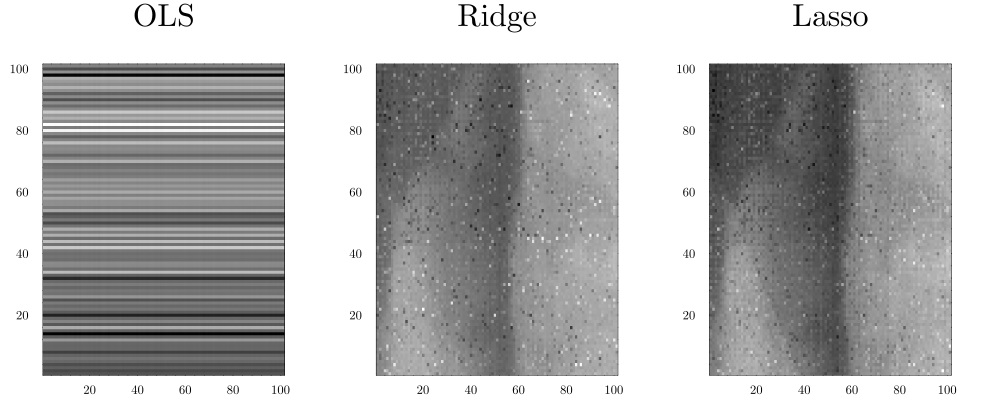

In [78]:
heatmap(layout=(1,3),reshape(estOLS, (ymax-ymin+1,xmax-xmin+1)), color = :greys,size=(1000,400),cbar=false,title="OLS",titlefontsize=20, top_margin=10mm)
heatmap!(subplot=2,reshape(estRidge, (ymax-ymin+1,xmax-xmin+1)), color = :greys,cbar=false,title="Ridge",titlefontsize=20, top_margin=10mm)
heatmap!(subplot=3,reshape(estLasso, (ymax-ymin+1,xmax-xmin+1)), color = :greys,cbar=false,title="Lasso",titlefontsize=20, top_margin=10mm)